In [1]:
import os
import numpy as np
import tensorflow
import tensorboard
import torch
from IPython.display import Image

In [2]:
!git clone https://github.com/ultralytics/yolov5

fatal: destination path 'yolov5' already exists and is not an empty directory.


In [3]:
%cd yolov5

/content/yolov5


In [4]:
!pip install -r requirements.txt

# Use pre-trained Yolov5

In [5]:
!python detect.py --weights yolov5x.pt --source /content/Image.jpeg --conf-thres 0.60 --line-thickness 2 --exist-ok

detect: weights=['yolov5x.pt'], source=/content/Image.jpeg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.6, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=True, line_thickness=2, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-307-g920c721e Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

100% 166M/166M [00:00<00:00, 321MB/s]

Fusing layers... 
YOLOv5x summary: 444 layers, 86705005 parameters, 0 gradients, 205.5 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/Image.jpeg: 384x640 6 persons, 3 cars, 4 traffic lights, 2 umbrellas, 1 tv, 63.8ms
Speed: 0.6ms pre-process, 63.8ms inference, 681.6ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


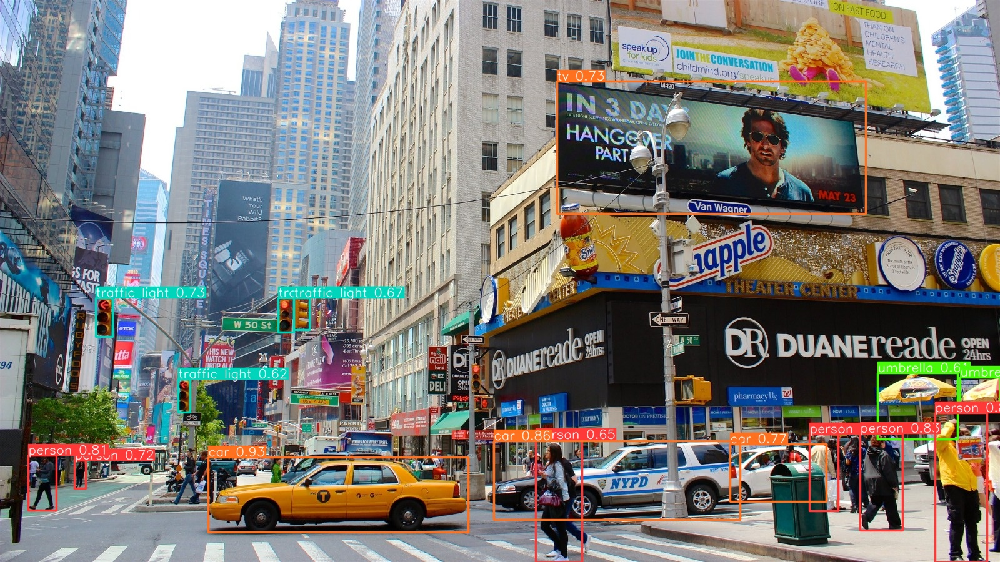

In [6]:
Image('/content/yolov5/runs/detect/exp/Image.jpeg')

In [7]:
!python detect.py --source /content/cars_people.mp4 --conf-thres 0.60 --line-thickness 2 --exist-ok

detect: weights=yolov5s.pt, source=/content/cars_people.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.6, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=True, line_thickness=2, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-307-g920c721e Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

100% 14.1M/14.1M [00:00<00:00, 258MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
video 1/1 (1/2095) /content/cars_people.mp4: 384x640 2 persons, 2 bicycles, 2 cars, 53.1ms
video 1/1 (2/2095) /content/cars_people.mp4: 384x640 2 persons, 1 bicycle, 2 cars, 8.0ms
video 1/1 (3/2095) /content/cars_people.mp4: 384x640 2 persons, 1 bicycle, 2 cars, 7.9ms
video 1/1 (4/2095) /content/cars_peopl

In [8]:
#from IPython.display import Video
#Video('/content/yolov5/runs/detect/exp/cars_people.mp4', embed=True)

# Traffic Signs Dataset

In [9]:
%cd ..

/content


In [10]:
!pip install kaggle

In [11]:
!ls /content

cars_people.mp4  dataset.yaml  Image.jpeg  kaggle.json	sample_data  Traffic_Signs.jpeg  yolov5


In [12]:
!mkdir -p ~/.kaggle
!cp /content/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [13]:
from kaggle.api.kaggle_api_extended import KaggleApi
api = KaggleApi()
api.authenticate()
Traffic_Dataset  = "valentynsichkar/traffic-signs-dataset-in-yolo-format"
api.dataset_download_files(Traffic_Dataset)
print('Done!')

Dataset URL: https://www.kaggle.com/datasets/valentynsichkar/traffic-signs-dataset-in-yolo-format
Done!


In [14]:
import zipfile
# extraction of traffic-signs-dataset-in-yolo-format from zipfiles to dataset folder
extract_path = '/content/dataset/'
zip_file_path = '/content/traffic-signs-dataset-in-yolo-format.zip'
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print(' Extraction is completed\n')

 Extraction is completed



In [15]:
import os
from random import choice
import shutil

In [16]:
imgs =[]
xmls =[]

train_path = '/content/yolov5/data/images/train'
val_path = '/content/yolov5/data/images/val'
source_path = '/content/dataset/ts/ts'

if not os.path.exists(train_path):
  os.mkdir(train_path)
if not os.path.exists(val_path):
  os.mkdir(val_path)

train_ratio = 0.8
val_ratio = 0.2

#total count of imgs
totalImgCount = len(os.listdir(source_path))/2

#soring files to corresponding arrays
for (dirname, dirs, files) in os.walk(source_path):
    for filename in files:
        if filename.endswith('.txt'):
            xmls.append(filename)
        else:
            imgs.append(filename)


#counting range for cycles
countForTrain = int(len(imgs)*train_ratio)
countForVal = int(len(imgs)*val_ratio)
print("training images are : ",countForTrain)
print("Validation images are : ",countForVal)

training images are :  592
Validation images are :  148


In [18]:
trainimagePath = '/content/yolov5/data/images/train'
trainlabelPath =  '/content/yolov5/data/labels/train'
valimagePath = '/content/yolov5/data/images/val'
vallabelPath = '/content/yolov5/data/labels/val'

if not os.path.exists(trainimagePath):
  os.mkdir(trainimagePath)
if not os.path.exists(trainlabelPath):
  os.mkdir(trainlabelPath)
if not os.path.exists(valimagePath):
  os.mkdir(valimagePath)
if not os.path.exists(vallabelPath):
  os.mkdir(vallabelPath)

In [19]:
for x in range(countForTrain):

    fileJpg = choice(imgs) # get name of random image from origin dir
    fileXml = fileJpg[:-4] +'.txt' # get name of corresponding annotation file

#move both files into train dir
    shutil.copy(os.path.join(source_path, fileJpg), os.path.join(trainimagePath, fileJpg))
    shutil.copy(os.path.join(source_path, fileXml), os.path.join(trainlabelPath, fileXml))

    #remove files from arrays
    imgs.remove(fileJpg)
    xmls.remove(fileXml)


#move both files into trvalidation dir
for x in range(countForVal):

    fileJpg = choice(imgs) # get name of random image from origin dir
    fileXml = fileJpg[:-4] +'.txt' # get name of corresponding annotation file

    #move both files into train dir

    shutil.copy(os.path.join(source_path, fileJpg), os.path.join(valimagePath, fileJpg))
    shutil.copy(os.path.join(source_path, fileXml), os.path.join(vallabelPath, fileXml))

    #remove files from arrays
    imgs.remove(fileJpg)
    xmls.remove(fileXml)

In [20]:
%cd yolov5

/content/yolov5


In [21]:
shutil.copy('/content/dataset.yaml', '/content/yolov5/data')

'/content/yolov5/data/dataset.yaml'

In [22]:
#os.environ['OMP_NUM_THREADS'] = '1'

In [29]:
!python train.py --img 416 --batch 20 --epochs 50 --data dataset.yaml --weights yolov5m.pt --cache

2024-05-08 07:48:58.327333: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-08 07:48:58.327387: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-08 07:48:58.328909: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5m.pt, cfg=, data=dataset.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=20, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, opt

In [31]:
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

In [56]:
!python detect.py --source /content/road2.jpg --weights /content/yolov5/runs/train/exp2/weights/best.pt --line-thickness 1 --exist-ok

detect: weights=['/content/yolov5/runs/train/exp2/weights/best.pt'], source=/content/road2.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=True, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-307-g920c721e Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 212 layers, 20865057 parameters, 0 gradients, 47.9 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/road2.jpg: 448x640 1 inhibitory, 1 danger, 81.1ms
Speed: 0.6ms pre-process, 81.1ms inference, 877.2ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


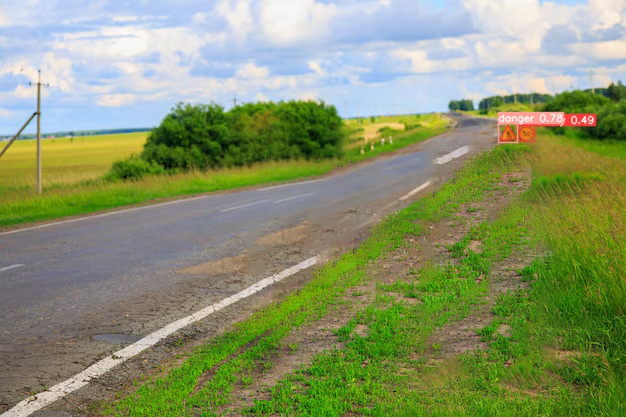

In [57]:
Image('/content/yolov5/runs/detect/exp/road2.jpg')

In [53]:
!python detect.py --source /content/Graal-Müritz_Waldstraße.JPG --weights /content/yolov5/runs/train/exp2/weights/best.pt --line-thickness 2 --exist-ok

detect: weights=['/content/yolov5/runs/train/exp2/weights/best.pt'], source=/content/Graal-Müritz_Waldstraße.JPG, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=True, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-307-g920c721e Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 212 layers, 20865057 parameters, 0 gradients, 47.9 GFLOPs
image 1/1 /content/Graal-Müritz_Waldstraße.JPG: 480x640 1 inhibitory, 1 danger, 57.9ms
Speed: 0.5ms pre-process, 57.9ms inference, 487.2ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


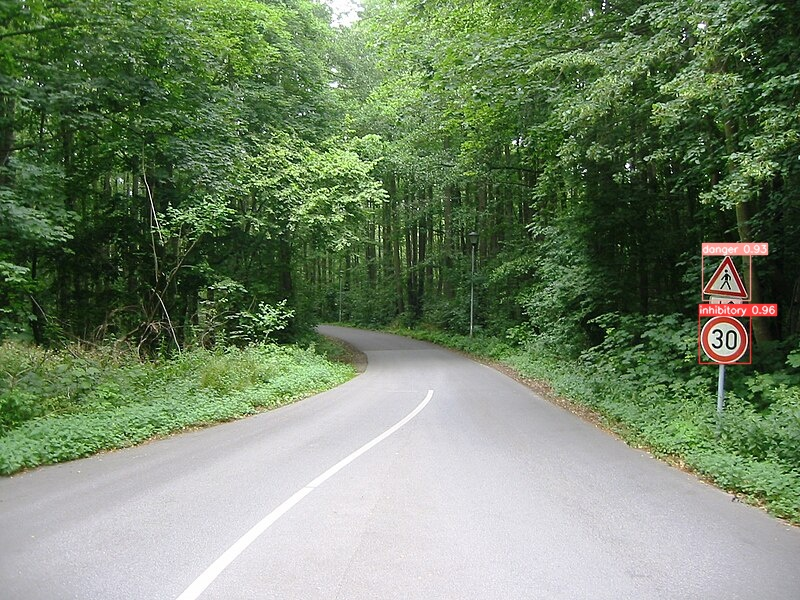

In [55]:
Image('/content/yolov5/runs/detect/exp/Graal-Müritz_Waldstraße.JPG')

In [58]:
!python detect.py --source /content/prohibition-signs-for-cars-.jpg --weights /content/yolov5/runs/train/exp2/weights/best.pt --line-thickness 2 --exist-ok

detect: weights=['/content/yolov5/runs/train/exp2/weights/best.pt'], source=/content/prohibition-signs-for-cars-.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=True, line_thickness=2, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-307-g920c721e Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 212 layers, 20865057 parameters, 0 gradients, 47.9 GFLOPs
image 1/1 /content/prohibition-signs-for-cars-.jpg: 448x640 1 danger, 2 mandatorys, 1 other, 49.6ms
Speed: 0.6ms pre-process, 49.6ms inference, 455.9ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


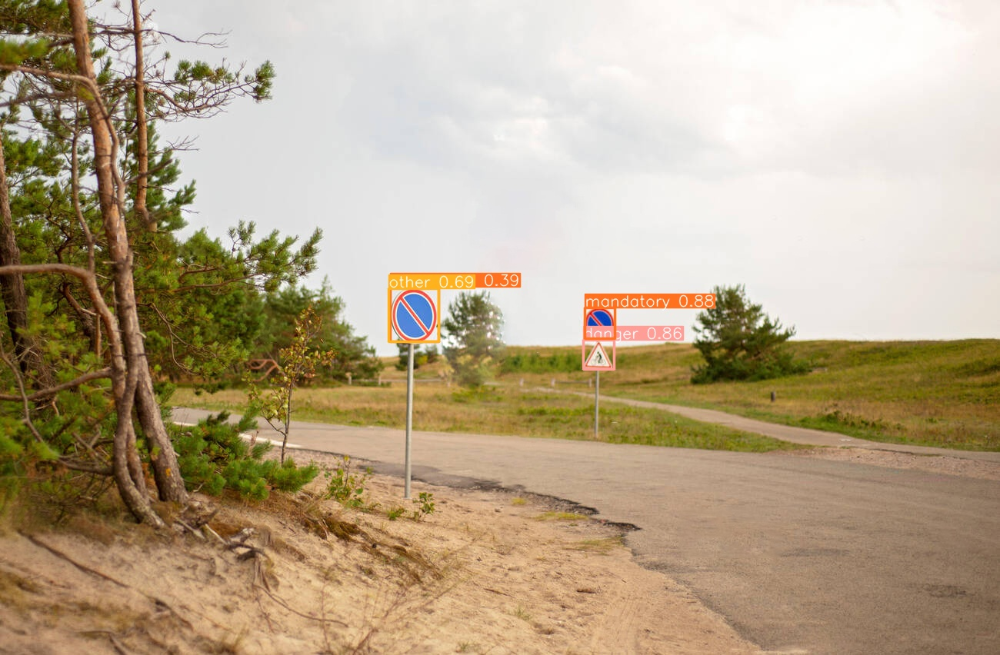

In [59]:
Image('/content/yolov5/runs/detect/exp/prohibition-signs-for-cars-.jpg')